In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
#import plotly
#import plotly.graph_objects as go
#import plotly.express as px
from bokeh.plotting import figure, show, output_notebook


from scipy import stats
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor


## Data Cleaning 

In [2]:
#Importing data
ny_df = pd.read_csv('/Users/emilykasa/Desktop/repos/Capstone_Project/capstone_data/new-york-city-airbnb-open-data/AB_NYC_2019.csv')
ny_df
#ny_df.info()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48890,36484665,Charming one bedroom - newly renovated rowhouse,8232441,Sabrina,Brooklyn,Bedford-Stuyvesant,40.67853,-73.94995,Private room,70,2,0,NaN,NaN,2,9
48891,36485057,Affordable room in Bushwick/East Williamsburg,6570630,Marisol,Brooklyn,Bushwick,40.70184,-73.93317,Private room,40,4,0,NaN,NaN,2,36
48892,36485431,Sunny Studio at Historical Neighborhood,23492952,Ilgar & Aysel,Manhattan,Harlem,40.81475,-73.94867,Entire home/apt,115,10,0,NaN,NaN,1,27
48893,36485609,43rd St. Time Square-cozy single bed,30985759,Taz,Manhattan,Hell's Kitchen,40.75751,-73.99112,Shared room,55,1,0,NaN,NaN,6,2


In [4]:
ny_df[ny_df["name"].isna()]

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
2854,1615764,NaN,6676776,Peter,Manhattan,Battery Park City,40.71239,-74.01620,Entire home/apt,400,1000,0,NaN,NaN,1,362
3703,2232600,NaN,11395220,Anna,Manhattan,East Village,40.73215,-73.98821,Entire home/apt,200,1,28,2015-06-08,0.45,1,341
5775,4209595,NaN,20700823,Jesse,Manhattan,Greenwich Village,40.73473,-73.99244,Entire home/apt,225,1,1,2015-01-01,0.02,1,0
5975,4370230,NaN,22686810,Michaël,Manhattan,Nolita,40.72046,-73.99550,Entire home/apt,215,7,5,2016-01-02,0.09,1,0
6269,4581788,NaN,21600904,Lucie,Brooklyn,Williamsburg,40.71370,-73.94378,Private room,150,1,0,NaN,NaN,1,0
6567,4756856,NaN,1832442,Carolina,Brooklyn,Bushwick,40.70046,-73.92825,Private room,70,1,0,NaN,NaN,1,0
6605,4774658,NaN,24625694,Josh,Manhattan,Washington Heights,40.85198,-73.93108,Private room,40,1,0,NaN,NaN,1,0
8841,6782407,NaN,31147528,Huei-Yin,Brooklyn,Williamsburg,40.71354,-73.93882,Private room,45,1,0,NaN,NaN,1,0
11963,9325951,NaN,33377685,Jonathan,Manhattan,Hell's Kitchen,40.76436,-73.98573,Entire home/apt,190,4,1,2016-01-05,0.02,1,0
12824,9787590,NaN,50448556,Miguel,Manhattan,Harlem,40.80316,-73.95189,Entire home/apt,300,5,0,NaN,NaN,5,0


In [4]:
#Take a look at naan values
missing_data_summary = (ny_df.isnull().sum()/len(ny_df))*100
missing_data_summary
#looks like if there are no reviews then last review and reviews per month are both NaN

id                                 0.000000
name                               0.032723
host_id                            0.000000
host_name                          0.042949
neighbourhood_group                0.000000
neighbourhood                      0.000000
latitude                           0.000000
longitude                          0.000000
room_type                          0.000000
price                              0.000000
minimum_nights                     0.000000
number_of_reviews                  0.000000
last_review                       20.558339
reviews_per_month                 20.558339
calculated_host_listings_count     0.000000
availability_365                   0.000000
dtype: float64

In [3]:
#dropping rows with nan would mean losing 20% of our data, but dropping the columns would be a loss of a possibly important predictor
ny_df[ny_df.isna()["reviews_per_month"]]
reviews_per_month_no_nan=ny_df[ny_df.notnull()["reviews_per_month"]]
reviews_per_month_no_nan

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0
5,5099,Large Cozy 1 BR Apartment In Midtown East,7322,Chris,Manhattan,Murray Hill,40.74767,-73.97500,Entire home/apt,200,3,74,2019-06-22,0.59,1,129
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48782,36425863,Lovely Privet Bedroom with Privet Restroom,83554966,Rusaa,Manhattan,Upper East Side,40.78099,-73.95366,Private room,129,1,1,2019-07-07,1.00,1,147
48790,36427429,No.2 with queen size bed,257683179,H Ai,Queens,Flushing,40.75104,-73.81459,Private room,45,1,1,2019-07-07,1.00,6,339
48799,36438336,Seas The Moment,211644523,Ben,Staten Island,Great Kills,40.54179,-74.14275,Private room,235,1,1,2019-07-07,1.00,1,87
48805,36442252,1B-1B apartment near by Metro,273841667,Blaine,Bronx,Mott Haven,40.80787,-73.92400,Entire home/apt,100,1,2,2019-07-07,2.00,1,40


In [6]:
#lets see what 
fig = px.scatter(reviews_per_month_no_nan, x="reviews_per_month", y="price", trendline='ols')
fig.show()



NameError: name 'px' is not defined

In [4]:
#Lets replace the nan values in the reviews_per_month with 0 and drop the last_review  column
ny_df["reviews_per_month"] = ny_df["reviews_per_month"].fillna(0)
ny_df.drop('last_review', axis=1, inplace=True)

In [5]:
#Now lets deal with the missing names and host names. Since we might want to use names later, we wont drop
#We also want to get rid of NaN values, so we'll replace NaN with Unkown 

ny_df["name"] = ny_df["name"].fillna("Unknown")
ny_df["host_name"] = ny_df["name"].fillna("Unknown")


In [6]:
#making sure we don't have any nan values left 
missing_data_summary = (ny_df.isnull().sum()/len(ny_df))*100
missing_data_summary

id                                0.0
name                              0.0
host_id                           0.0
host_name                         0.0
neighbourhood_group               0.0
neighbourhood                     0.0
latitude                          0.0
longitude                         0.0
room_type                         0.0
price                             0.0
minimum_nights                    0.0
number_of_reviews                 0.0
reviews_per_month                 0.0
calculated_host_listings_count    0.0
availability_365                  0.0
dtype: float64

In [7]:
#Moving price to the end of the dataframe
ny_df.columns
ny_df=ny_df[['id', 'name', 'host_id', 'host_name', 'neighbourhood_group',
       'neighbourhood', 'latitude', 'longitude', 'room_type',
       'minimum_nights', 'number_of_reviews', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365','price']]

## EDA##

In [10]:
#Lets just check some basic correllation properties
ny_df.corr()

,id,host_id,latitude,longitude,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,price
id,1.000000,0.588290,-0.003125,0.090908,-0.013224,-0.319760,0.180221,0.133272,0.085468,0.010619
host_id,0.588290,1.000000,0.020224,0.127055,-0.017364,-0.140106,0.209783,0.154950,0.203492,0.015309
latitude,-0.003125,0.020224,1.000000,0.084788,0.024869,-0.015389,-0.018758,0.019517,-0.010983,0.033939
longitude,0.090908,0.127055,0.084788,1.000000,-0.062747,0.059094,0.138516,-0.114713,0.082731,-0.150019
minimum_nights,-0.013224,-0.017364,0.024869,-0.062747,1.000000,-0.080116,-0.124905,0.127960,0.144303,0.042799
number_of_reviews,-0.319760,-0.140106,-0.015389,0.059094,-0.080116,1.000000,0.589407,-0.072376,0.172028,-0.047954
reviews_per_month,0.180221,0.209783,-0.018758,0.138516,-0.124905,0.589407,1.000000,-0.047312,0.163732,-0.050564
calculated_host_listings_count,0.133272,0.154950,0.019517,-0.114713,0.127960,-0.072376,-0.047312,1.000000,0.225701,0.057472
availability_365,0.085468,0.203492,-0.010983,0.082731,0.144303,0.172028,0.163732,0.225701,1.000000,0.081829
price,0.010619,0.015309,0.033939,-0.150019,0.042799,-0.047954,-0.050564,0.057472,0.081829,1.000000


### Name EDA

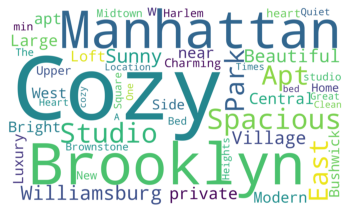

In [11]:
#Lets build a wordcloud of common names in 

from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator


text = " ".join(name for name in ny_df.name)

whitelist = set('abcdefghijklmnopqrstuvwxyz ABCDEFGHIJKLMNOPQRSTUVWXYZ')

names_concat = ''.join(filter(whitelist.__contains__, text))
names_concat=names_concat.split(" ")

word_counts={}
for i in names_concat:
    if i not in word_counts:
        word_counts[i]=0
    word_counts[i]+=1

#Get rid of words with little meaning
stopwords = set(STOPWORDS)
stopwords.update(["Room", "Bedroom", "Private", "In", "in", "NYC", "apartment", "room", "bedroom", "br", "Apartment", "BR", " "])

for i in stopwords:
    if i in word_counts:
        del word_counts[i]


wordcloud = WordCloud(background_color="white", width=5000, height=3000, max_words=50).generate_from_frequencies(word_counts)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

#text

In [12]:
#trying to see if we can get info on number of bedrooms
#\d+\s(?i)(

import re 
bedrooms=[]
for i in ny_df["name"]:
    m=re.match("^\d+\s(?i)(br|bedroom)", i)
    bedrooms.append(m)    

ny_df["number_of_bedrooms"]=bedrooms
ny_df["number_of_bedrooms"] = ny_df["number_of_bedrooms"].fillna("Unknown")
ny_df["number_of_bedrooms"] = ny_df["number_of_bedrooms"].astype('category')


ny_df.groupby("number_of_bedrooms")["price"].mean()
#looks like only 648 out of 50k have bedroom info. This is likely insufficient
#ny_df.head()

/Users/emilykasa/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: DeprecationWarning: Flags not at the start of the expression '^\\d+\\s(?i)(br|bedroo' (truncated)
  import sys
/Users/emilykasa/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/Users/emilykasa/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # T

number_of_bedrooms
Unknown                                              152.132112
<re.Match object; span=(0, 9), match='2 bedroom'>    250.000000
<re.Match object; span=(0, 9), match='2 bedroom'>    105.000000
<re.Match object; span=(0, 4), match='2 BR'>         350.000000
<re.Match object; span=(0, 9), match='1 Bedroom'>    130.000000
                                                        ...    
<re.Match object; span=(0, 9), match='3 Bedroom'>    520.000000
<re.Match object; span=(0, 9), match='3 Bedroom'>    110.000000
<re.Match object; span=(0, 4), match='3 Br'>         245.000000
<re.Match object; span=(0, 9), match='2 bedroom'>     80.000000
<re.Match object; span=(0, 9), match='1 bedroom'>     80.000000
Name: price, Length: 808, dtype: float64

In [13]:
#sorting words_count dict by values (word counts)
import collections as c

sorted_keys = sorted(word_counts, key=word_counts.get, reverse=True)
sorted_keys

sorted_list_wc=[]
for r in sorted_keys:
    sorted_list_wc.append((r, word_counts[r]))
sorted_list_wc

[('', 22534),
 ('Cozy', 4117),
 ('Brooklyn', 3865),
 ('Manhattan', 3150),
 ('Spacious', 3059),
 ('Studio', 2865),
 ('Apt', 2742),
 ('East', 2714),
 ('Park', 2692),
 ('Williamsburg', 2506),
 ('Sunny', 2350),
 ('Beautiful', 2079),
 ('Village', 2054),
 ('private', 1721),
 ('Large', 1642),
 ('Central', 1545),
 ('apt', 1535),
 ('near', 1511),
 ('Modern', 1455),
 ('w', 1425),
 ('Loft', 1409),
 ('Bright', 1389),
 ('West', 1385),
 ('Luxury', 1291),
 ('Bushwick', 1272),
 ('Side', 1210),
 ('Charming', 1201),
 ('Upper', 1200),
 ('heart', 1117),
 ('New', 1114),
 ('Home', 1108),
 ('Harlem', 1042),
 ('min', 1022),
 ('Midtown', 1008),
 ('studio', 951),
 ('Brownstone', 923),
 ('Bed', 923),
 ('Square', 901),
 ('The', 899),
 ('Heights', 880),
 ('Heart', 844),
 ('Great', 819),
 ('Quiet', 814),
 ('One', 783),
 ('Location', 777),
 ('Times', 773),
 ('A', 728),
 ('Clean', 727),
 ('cozy', 696),
 ('bed', 692),
 ('Near', 691),
 ('Garden', 675),
 ('home', 652),
 ('Huge', 649),
 ('Chelsea', 632),
 ('location', 62

### Room Type EDA

In [11]:
#Lets look at prices based on room type

fig = px.histogram(ny_df[ny_df["price"]<1000], x="price", color="room_type", nbins=30, title='Histogram of Price By Room Type')
fig.update_layout(barmode='overlay')
fig.update_traces(opacity=0.75)
fig.show()

NameError: name 'px' is not defined

### Minimum_nights EDA

In [15]:
fig = px.histogram(ny_df[ny_df["minimum_nights"]<10], x="minimum_nights", nbins=20, title='Histogram of Min Nights, 0-10 Min Nights')
fig.show()

fig = px.histogram(ny_df[ny_df["minimum_nights"]<30], x="minimum_nights", nbins=20, title='Histogram of Min Nights, 0-30 Min Nights')
fig.show()

fig = px.histogram(ny_df, x="minimum_nights", nbins=20, title='Histogram of Min Nights, Entire Data')
fig.show()

print('the mode is ', ny_df["minimum_nights"].mode())
print('the median is ', ny_df["minimum_nights"].median())
print('the mean is ', ny_df["minimum_nights"].mean())




the mode is  0    1
dtype: int64
the median is  3.0
the mean is  7.029962163820431


/Users/emilykasa/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()


min_nights_cat
long        747
medium    15733
short     32415
Name: id, dtype: int64

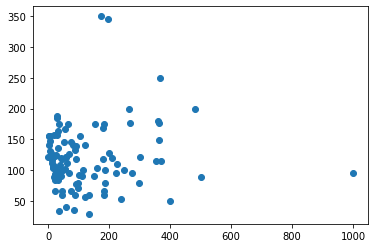

In [10]:
def min_nights_consolidate(min_nights):
    if min_nights <= 3:
        return "short"
    elif min_nights > 3 and min_nights <= 30:
        return "medium"
    else:
        return "long"
        
        
min_nights_consolidate(10)      
ny_df["min_nights_cat"]=ny_df["minimum_nights"].apply(min_nights_consolidate)
ny_df.groupby("minimum_nights")["price"].mean()

blah=ny_df.query('price <1000 & minimum_nights<1000').groupby("minimum_nights")["price"].mean()
plt.scatter(x=blah.index, y=blah.values)
ny_df.groupby("min_nights_cat")["id"].count()

In [9]:
#Lets look at prices based on room type

fig = px.histogram(ny_df[ny_df["price"]<1000], x="price", color="min_nights_cat", nbins=30, title='Histogram of Price By Room Type')
fig.update_layout(barmode='overlay')
fig.update_traces(opacity=0.75)
fig.show()

ny_df[ny_df["price"]<1000].groupby("min_nights_cat").mean()["price"]

#Interestingly, the mean for 

NameError: name 'px' is not defined

### Longitude/Latitude EDA 

In [18]:
#Lets look at prices based on latitude (note that Mahattan )

fig = px.scatter(ny_df[ny_df["price"]<1000], x="longitude", y="price", title='Longitude vs Price', trendline='ols')
results = px.get_trendline_results(fig)
fig.show()
results = px.get_trendline_results(fig)

In [19]:
#Lets look at prices based on latitude (note that Mahattan )

fig = px.scatter(ny_df[ny_df["price"]<1000], x="latitude", y="price", title='Latitude vs Price', trendline='ols')
results = px.get_trendline_results(fig)
fig.show()
results = px.get_trendline_results(fig)

It seems as though longitude has an inverse relationship with price and latitude has a postive relationship with price. This makes some sense as Manhattan has lower longitudinal coordinates and higher latitude coordinates. Longitude seems to be more predictive than latitude

### Neighborhood and Room_type EDA

In [20]:
#Map looking at most expensive neighborhoods
from plotly.subplots import make_subplots

neighborhoods=ny_df.groupby(["neighbourhood", "room_type"])[["price", "latitude", "longitude", "minimum_nights"]].mean().reset_index()
neighborhoods.sort_values('price', ascending=False, inplace=True)
rich_neighborhoods=neighborhoods


fig = px.scatter_mapbox(rich_neighborhoods, lat="latitude", lon="longitude",  size="price", color="room_type", size_max=15, zoom=10, hover_name="neighbourhood", hover_data=["price", "minimum_nights"], title="Map of Prices By Neighborhood and Roomtype")
fig.update_layout(mapbox_style="carto-positron")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()
#we notice that the locations with the highest average per night cost also have the highest minimum night requirements


In [21]:
#Maps looking at prices for each Airbnb 

ny_df_low_prices=ny_df[ny_df['price']<100]
fig = px.scatter_mapbox(ny_df_low_prices, lat="latitude", lon="longitude",  color="price", size_max=15, zoom=10)
fig.update_layout(mapbox_style="carto-positron")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [22]:
ny_df_med_prices=ny_df.query('price < 300 and price > 100 ')
fig = px.scatter_mapbox(ny_df_med_prices, lat="latitude", lon="longitude",  color="price", size_max=15, zoom=10)
fig.update_layout(mapbox_style="carto-positron")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [23]:
ny_df_high_prices=ny_df.query('price > 300 ')
fig = px.scatter_mapbox(ny_df_high_prices, lat="latitude", lon="longitude",  color="price", size_max=15, zoom=10)
fig.update_layout(mapbox_style="carto-positron")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

## Modeling 

In [13]:
ny_df_columns=list(ny_df.columns)
ny_df_columns=['id',
 'name',
 'host_id',
 'host_name',
 'neighbourhood_group',
 'neighbourhood',
 'latitude',
 'longitude',
 'room_type',
 'minimum_nights',
 'number_of_reviews',
 'reviews_per_month',
 'calculated_host_listings_count',
 'availability_365',
 'min_nights_cat','price']
ny_df=ny_df[ny_df_columns]
ny_df.loc[:, ny_df.columns != 'price']

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,min_nights_cat
0,2539,Clean & quiet apt home by the park,2787,Clean & quiet apt home by the park,Brooklyn,Kensington,40.64749,-73.97237,Private room,1,9,0.21,6,365,short
1,2595,Skylit Midtown Castle,2845,Skylit Midtown Castle,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,1,45,0.38,2,355,short
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,THE VILLAGE OF HARLEM....NEW YORK !,Manhattan,Harlem,40.80902,-73.94190,Private room,3,0,0.00,1,365,short
3,3831,Cozy Entire Floor of Brownstone,4869,Cozy Entire Floor of Brownstone,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,1,270,4.64,1,194,short
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Entire Apt: Spacious Studio/Loft by central park,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,10,9,0.10,1,0,medium
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48890,36484665,Charming one bedroom - newly renovated rowhouse,8232441,Charming one bedroom - newly renovated rowhouse,Brooklyn,Bedford-Stuyvesant,40.67853,-73.94995,Private room,2,0,0.00,2,9,short
48891,36485057,Affordable room in Bushwick/East Williamsburg,6570630,Affordable room in Bushwick/East Williamsburg,Brooklyn,Bushwick,40.70184,-73.93317,Private room,4,0,0.00,2,36,medium
48892,36485431,Sunny Studio at Historical Neighborhood,23492952,Sunny Studio at Historical Neighborhood,Manhattan,Harlem,40.81475,-73.94867,Entire home/apt,10,0,0.00,1,27,medium
48893,36485609,43rd St. Time Square-cozy single bed,30985759,43rd St. Time Square-cozy single bed,Manhattan,Hell's Kitchen,40.75751,-73.99112,Shared room,1,0,0.00,6,2,short


In [15]:
#Splitting data into train and test
from sklearn.model_selection import train_test_split

X=ny_df.loc[:, ny_df.columns != 'price']
y=ny_df["price"]
split = 0.2
X_remainder, X_test, y_remainder, y_test = train_test_split(X, y, test_size=split, random_state=6)
for i in [X_remainder, X_test, y_remainder, y_test]:
    print(i.shape)


(39116, 15)
(9779, 15)
(39116,)
(9779,)


In [18]:
X_remainder=X_remainder.reset_index()
X_remainder.drop("index", axis=1, inplace=True)

y_remainder=y_remainder.reset_index()
y_remainder.drop("index", axis=1, inplace=True)


X_remainder=X_remainder.reset_index()
X_remainder.drop("index", axis=1, inplace=True)

y_test=y_test.reset_index()
y_test.drop("index", axis=1, inplace=True)




In [20]:
#Lets just try a simple regression with only the integer types to see what accuracy we can get 
X = X_remainder[['latitude', 'longitude', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365']]
y = y_remainder
X_withconstant = sm.add_constant(X)

# 1. Instantiate Model
myregression1 = sm.OLS(y,X_withconstant)

# 2. Fit Model (this returns a seperate object with the parameters)
myregression_results1 = myregression1.fit()

# Looking at the summary
myregression_results1.summary()

ValueError: shapes (39116,2) and (39116,2) not aligned: 2 (dim 1) != 39116 (dim 0)

### Added Features (add features to X_test BEFORE running)

In [22]:
#adding dummies for roomtype
room_type_dummies=pd.get_dummies(X_remainder['room_type'], prefix='room_type', drop_first=True).reset_index()
room_type_dummies.drop("index", axis=1, inplace=True)
ny_df_added_features_remainder = pd.concat([room_type_dummies, X_remainder], axis=1)
ny_df_added_features_remainder

#adding dist_from_midtown feature
ny_df_added_features_remainder["dist_from_midtown"]=abs(ny_df_added_features_remainder["latitude"]-40.7069)+abs(ny_df_added_features_remainder["latitude"]+74.0031)

#adding dummies for neighborhood group
ny_df_added_features_remainder = pd.concat([ny_df_added_features_remainder ,pd.get_dummies(X_remainder['neighbourhood_group'], prefix='neighbourhood_group', drop_first=True)],axis=1)

ny_df_added_features_remainder.head()

,room_type_Private room,room_type_Shared room,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,...,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,min_nights_cat,dist_from_midtown,neighbourhood_group_Brooklyn,neighbourhood_group_Manhattan,neighbourhood_group_Queens,neighbourhood_group_Staten Island
0,1,0,36154590,Private and Cozy Bedroom.,214483712,Private and Cozy Bedroom.,Staten Island,Bull's Head,40.59475,-74.16370,...,0,0.00,3,364,medium,114.71,0,0,0,1
1,1,0,5430658,nice room in bedstuy F,6885157,nice room in bedstuy F,Brooklyn,Bedford-Stuyvesant,40.68182,-73.95152,...,49,0.94,15,359,short,114.71,1,0,0,0
2,0,0,20194954,Relaxing & cozy apt in Brooklyn mins to Manhattan,13462855,Relaxing & cozy apt in Brooklyn mins to Manhattan,Brooklyn,Bedford-Stuyvesant,40.68004,-73.93928,...,62,2.70,2,280,short,114.71,1,0,0,0
3,1,0,31711687,PRIVATE 1 Bedroom w/ your own bathroom & entra...,15058648,PRIVATE 1 Bedroom w/ your own bathroom & entra...,Brooklyn,Bushwick,40.69814,-73.92805,...,3,1.13,3,21,short,114.71,1,0,0,0
4,0,0,7003507,Whole Apartment - Beautiful Sunny Studio,6968630,Whole Apartment - Beautiful Sunny Studio,Brooklyn,Crown Heights,40.67627,-73.94775,...,5,0.10,1,1,medium,114.71,1,0,0,0


In [23]:
#Adding additional features to test

#adding dummies for roomtype
room_type_dummies=pd.get_dummies(X_test['room_type'], prefix='room_type', drop_first=True).reset_index()
room_type_dummies.drop("index", axis=1, inplace=True)
ny_df_added_features_test = pd.concat([room_type_dummies, X_test], axis=1)
ny_df_added_features_test

#adding dist_from_midtown feature
ny_df_added_features_test["dist_from_midtown"]=abs(ny_df_added_features_test["latitude"]-40.7069)+abs(ny_df_added_features_test["latitude"]+74.0031)

#adding dummies for neighborhood group
ny_df_added_features_test = pd.concat([ny_df_added_features_test ,pd.get_dummies(X_test['neighbourhood_group'], prefix='neighbourhood_group', drop_first=True)],axis=1)

ny_df_added_features_test.head()

,room_type_Private room,room_type_Shared room,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,...,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,min_nights_cat,dist_from_midtown,neighbourhood_group_Brooklyn,neighbourhood_group_Manhattan,neighbourhood_group_Queens,neighbourhood_group_Staten Island
0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.0,0.0,3647.0,THE VILLAGE OF HARLEM....NEW YORK !,4632.0,THE VILLAGE OF HARLEM....NEW YORK !,Manhattan,Harlem,40.80902,-73.9419,...,0.0,0.0,1.0,365.0,short,114.91424,0.0,1.0,0.0,0.0
3,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#adding expensive words in name to try to get more predictive power
expensive=["penthouse", "luxury", "renovated", "Penthouse", "Large", "Views", "Doorman", "Spacious", "park", "Park", "Tribecca"]

Expensive_words=[]
for name in X_train["name"]:
    expensive_word_count=0
    for i in expensive:
        if i in name:
            expensive_word_count+=1
    Expensive_words.append(expensive_word_count)
    


ny_df_added_features_train["Expensive_words"]=Expensive_words
ny_df_added_features_train.columns

In [26]:
#Lets try OLS with these added features

X = ny_df_added_features_remainder[['latitude', 'longitude', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365', 'dist_from_midtown', 'room_type_Private room', 'room_type_Shared room', 'neighbourhood_group_Brooklyn', 'neighbourhood_group_Manhattan', 'neighbourhood_group_Queens', 'neighbourhood_group_Staten Island' ]]
y = y_remainder
X_withconstant = sm.add_constant(X)

# 1. Instantiate Model
myregression1 = sm.OLS(y,X_withconstant)

# 2. Fit Model (this returns a seperate object with the parameters)
myregression_results1 = myregression1.fit()

# Looking at the summary
myregression_results1.summary()

ValueError: shapes (39116,2) and (39116,2) not aligned: 2 (dim 1) != 39116 (dim 0)

In [27]:
from sklearn.feature_extraction.text import CountVectorizer




# 1. Instantiate 
bagofwords = CountVectorizer(min_df=10)

# 2. Fit 
bagofwords.fit(X_remainder["name"])

# 3. Transform
X_remainder_bagofwords = bagofwords.transform(X_remainder["name"])
X_test_bagofwords = bagofwords.transform(X_test["name"])




In [28]:
bagofwords.get_feature_names()
X_remainder_bagofwords.toarray()
X_test_bagofwords.toarray()


bag_of_words_train = pd.DataFrame(columns=bagofwords.get_feature_names(), data=X_remainder_bagofwords.toarray())
bag_of_words_test = pd.DataFrame(columns=bagofwords.get_feature_names(), data=X_test_bagofwords.toarray())




In [34]:
X_remainder_continuous = X_remainder[['latitude', 'longitude', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365']].reset_index()
X_test_continuous = X_test[['latitude', 'longitude', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365']].reset_index()

X_remainder_basic_dataframe = pd.DataFrame(X_remainder).reset_index()
X_test_basic_dataframe = pd.DataFrame(X_test).reset_index()

X_remainder_baseline=pd.concat([bag_of_words_train, X_remainder_continuous], axis=1, ignore_index=True)
X_test_baseline=pd.concat([bag_of_words_test, X_test_continuous], axis=1, ignore_index=True)

X_remainder_added_features=pd.concat([ny_df_added_features_remainder, bag_of_words_train], axis=1)
X_test_added_features=pd.concat([ny_df_added_features_test, bag_of_words_test], axis=1)





print(X_remainder_added_features.shape)
print(X_test_added_features.shape)


X_remainder_added_features

(39116, 1135)
(17625, 1135)


,room_type_Private room,room_type_Shared room,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,...,yoga,york,yorker,you,young,your,yours,yourself,zen,zoo
0,1,0,36154590,Private and Cozy Bedroom.,214483712,Private and Cozy Bedroom.,Staten Island,Bull's Head,40.59475,-74.16370,...,0,0,0,0,0,0,0,0,0,0
1,1,0,5430658,nice room in bedstuy F,6885157,nice room in bedstuy F,Brooklyn,Bedford-Stuyvesant,40.68182,-73.95152,...,0,0,0,0,0,0,0,0,0,0
2,0,0,20194954,Relaxing & cozy apt in Brooklyn mins to Manhattan,13462855,Relaxing & cozy apt in Brooklyn mins to Manhattan,Brooklyn,Bedford-Stuyvesant,40.68004,-73.93928,...,0,0,0,0,0,0,0,0,0,0
3,1,0,31711687,PRIVATE 1 Bedroom w/ your own bathroom & entra...,15058648,PRIVATE 1 Bedroom w/ your own bathroom & entra...,Brooklyn,Bushwick,40.69814,-73.92805,...,0,0,0,0,0,1,0,0,0,0
4,0,0,7003507,Whole Apartment - Beautiful Sunny Studio,6968630,Whole Apartment - Beautiful Sunny Studio,Brooklyn,Crown Heights,40.67627,-73.94775,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39111,0,0,32160460,Brand New Elev BLDG Luxury Studio~heart of NYC~,162280872,Brand New Elev BLDG Luxury Studio~heart of NYC~,Manhattan,Hell's Kitchen,40.76163,-73.99602,...,0,0,0,0,0,0,0,0,0,0
39112,1,0,3318859,Studio w/ Private Entry in Greenpoint Brooklyn,9306976,Studio w/ Private Entry in Greenpoint Brooklyn,Brooklyn,Greenpoint,40.73535,-73.95650,...,0,0,0,0,0,0,0,0,0,0
39113,1,0,33364906,sofa bed room with outdoor event space,250928371,sofa bed room with outdoor event space,Brooklyn,Bedford-Stuyvesant,40.69644,-73.94113,...,0,0,0,0,0,0,0,0,0,0
39114,1,0,32040396,Ditmas Park Apartment Share,9124906,Ditmas Park Apartment Share,Brooklyn,Flatbush,40.64004,-73.96640,...,0,0,0,0,0,0,0,0,0,0


In [35]:
X_remainder_added_features.drop(["neighbourhood_group", "neighbourhood", "room_type", "name", "host_id", "host_name", "host_id", "min_nights_cat"], axis=1, inplace=True)
X_test_added_features.drop(["neighbourhood_group", "neighbourhood", "room_type", "name", "host_id", "host_name", "host_id", "min_nights_cat"], axis=1, inplace=True)

In [37]:
print(X_remainder_added_features.shape)
print(X_test_added_features.shape)

(39116, 1128)
(17625, 1128)


In [38]:
from sklearn.linear_model import LinearRegression
# 1. Instantiate the model
linear_regression_model = LinearRegression()

# 2. Fit the model
linear_regression_model.fit(X_remainder_baseline, y_remainder)

#The intercept
intercept = linear_regression_model.intercept_

#The coefficient, notice it returns an array with one spot for each feature
coefficient = linear_regression_model.coef_

print(f'Intercept: {intercept}')
print(f'Coefficients:{coefficient}')



Intercept: [ 2.18278728e-10 -3.98771378e+04]
Coefficients:[[ 7.08772710e-13 -2.30874209e-11  5.15165688e-12 ...  1.43713138e-13
  -1.93179297e-15  2.13937164e-15]
 [ 2.82404253e+02  3.73811730e+00  1.84851626e+00 ... -2.41729454e+00
  -4.76913921e-01  1.31697957e-01]]


In [40]:
#baseline for lin reg 
from sklearn.metrics import r2_score

model_prediction_train = linear_regression_model.predict(X_remainder_baseline)
model_prediction_test = linear_regression_model.predict(X_test_baseline)



# Evaluate the model on each set
print(f'The R2 score on the training set: {r2_score(y_remainder,model_prediction_train)}')
print(f'The R2 score on the testing set: {r2_score(y_test,model_prediction_test)}')

#looks like we are massively overfitting- negative R2 on test 

The R2 score on the training set: 0.5956438055144675


ValueError: y_true and y_pred have different number of output (1!=2)

In [ ]:
#Lets try KNN 
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(X_remainder_baseline)
X_train = scaler.transform(X_remainder_baseline)
X_test = scaler.transform(X_test_baseline)

KNNmodel = KNeighborsRegressor(weights='distance', n_neighbors=2)
KNNmodel.fit(X_remainder_baseline, y_remainder)

print(f"R^2 score on training set: {KNNmodel.score(X_remainder_baseline, y_remainder)}")
print(f"R^2 score on test set: {KNNmodel.score(X_test_baseline, y_test)}")


/Users/emilykasa/opt/anaconda3/lib/python3.7/site-packages/sklearn/base.py:434: FutureWarning: The default value of multioutput (not exposed in score method) will change from 'variance_weighted' to 'uniform_average' in 0.23 to keep consistent with 'metrics.r2_score'. To specify the default value manually and avoid the warning, please either call 'metrics.r2_score' directly or make a custom scorer with 'metrics.make_scorer' (the built-in scorer 'r2' uses multioutput='uniform_average').
  "multioutput='uniform_average').", FutureWarning)


R^2 score on training set: 1.0


Coefficients:
Lasso: [ 4.83435962  0.          0.         ... -2.7398615  -0.
 15.66711536]
Ridge: [[  4.94564829   0.26855419   0.04284751 ...  -3.87987176 -15.7194519
   17.3433244 ]]

R-squared:
Lasso: 0.1799737645118209
Ridge: 0.19128760996088456


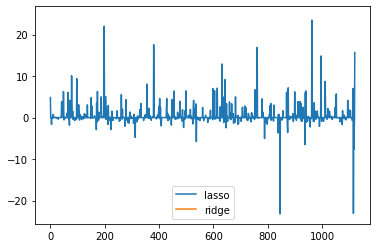

In [38]:
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge

# Create the lasso and ridge models
lasso = Lasso()
lasso.fit(X_remainder,y_train)
ridge = Ridge()
ridge.fit(X_remainder,y_train)

print("Coefficients:")
print("Lasso:", lasso.coef_)
print("Ridge:", ridge.coef_)
print("")

# Compare the coefficients
plt.plot(lasso.coef_)
plt.plot(ridge.coef_)
plt.legend(['lasso', 'ridge'])

# Compare R-squared
print("R-squared:")
print("Lasso:", lasso.score(X_remainder,y_train))
print("Ridge:", ridge.score(X_remainder,y_train))

In [39]:
#baseline for lin reg with ridge
from sklearn.metrics import r2_score

model_prediction_train = ridge.predict(X_remainder)
model_prediction_test = ridge.predict(X_test)



# Evaluate the model on each set
print(f'The R2 score on the training set: {r2_score(y_remainder,model_prediction_train)}')
print(f'The R2 score on the testing set: {r2_score(y_test,model_prediction_test)}')

The R2 score on the training set: 0.19128760996088456
The R2 score on the testing set: 0.14101866096756466


[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


##Takes too long to run-- visualizing whether there is a difference in types of names for different prices


def price_to_cat(price):
    if int(price) < 105:
         return "low"
    else:
        return "high"

y_train["cat"]=y_train["price"].apply(price_to_cat)
y_train

from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, random_state=0)
X_2d = tsne.fit_transform(bag_of_words_train)

sns.scatterplot(X_2d[:,0], X_2d[:,1], hue=y_train["cat"], legend='full')


In [21]:
#Running a logistic regression of bag of words on price to see which words have the most predictive power

from sklearn.linear_model import LogisticRegression

#Fit a logistic regression model
logreg_model = LogisticRegression()
logreg_model.fit(bag_of_words_remainder, y_remainder)

print(logreg_model.score(bag_of_words_remainder, y_remainder))
print(logreg_model.score(bag_of_words_test, y_test))


bag_of_words_train

/Users/emilykasa/opt/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


0.16862664894160956
0.0648328049902853


,000,10,100,1000,107,10min,10mins,11,116,11th,...,yoga,york,yorker,you,young,your,yours,yourself,zen,zoo
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39111,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
39112,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
39113,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
39114,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [36]:
indicies=[]
for i in bag_of_words_remainder:
    index=bag_of_words_remainder.columns.get_loc(i)
    indicies.append(index)

    
coef_lst=logreg_model.coef_.tolist()
tuples=list(zip(indicies, coef_lst[0]))
tuples

def Sort_Tuple(tup):  
  
    # reverse = None (Sorts in Ascending order)  
    # key is set to sort using second element of  
    # sublist lambda has been used  
    tup.sort(key = lambda x: x[1], reverse=True)  
    return tup 

Sorted_words=Sort_Tuple(tuples)

indicies_2=[]
for i in Sorted_words:
    indicies_2.append(i[0])

words_sorted=bag_of_words_train.columns[indicies_2]

#Bottom 30 words 
for i in words_sorted[0:30]:
    print(i)

coliving
shared
room
brownstone
modern
yet
hostel
2nd
ideal
design
spacious
it
master
style
nice
all
comfortable
brooklyn
best
living
space
view
close
huge
bedroom
heart
williamsburg
loft
to
cozy


In [35]:
def Sort_Tuple(tup):  
  
    # reverse = None (Sorts in Ascending order)  
    # key is set to sort using second element of  
    # sublist lambda has been used  
    tup.sort(key = lambda x: x[1])  
    return tup 

Reverse_Sorted_words=Sort_Tuple(tuples)

indicies_2=[]
for i in Reverse_Sorted_words:
    indicies_2.append(i[0])

words_sorted_reverse=bag_of_words_remainder.columns[indicies_2]

#Top 30 predictive words of high price
for i in words_sorted_reverse[0:30]:
    print(i)

apt
manhattan
in
studio
and
sunny
beautiful
nyc
park
east
bed
near
village
luxury
large
bright
location
new
home
1br
central
for
midtown
west
one
duplex
charming
bath
clean
br


In [58]:
X_train_added_features, X_validation_added_features, y_train, y_validation = \
    train_test_split(X_remainder_added_features, y_remainder, test_size = 0.3,
                     random_state=1)

In [66]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import cross_val_score

cross_validation_scores_val = []
cross_validation_scores_train = []




depths=range(1,10)
for depth in depths:
    tree = DecisionTreeRegressor(max_depth=depth)
    tree.fit(X_train_added_features, y_train)
    cv_score_val = np.mean(cross_val_score(tree, X_validation_added_features, y_validation, cv = 5))
    cross_validation_scores_val.append(cv_score_val)
    cv_score_train = np.mean(cross_val_score(tree, X_train_added_features, y_train, cv = 5))
    cross_validation_scores_train.append(cv_score_train)


    print(f'depth = {depth}')
    print(f"DT R^2 score on training set: {tree.score(X_train_added_features, y_train):0.3f}")
    print(f"DT R^2 score on validation set: {tree.score(X_validation_added_features, y_validation):0.3f}")
    


depth = 1
DT R^2 score on training set: 0.058
DT R^2 score on validation set: 0.064
depth = 2
DT R^2 score on training set: 0.093
DT R^2 score on validation set: 0.068
depth = 3
DT R^2 score on training set: 0.182
DT R^2 score on validation set: -0.213
depth = 4
DT R^2 score on training set: 0.291
DT R^2 score on validation set: -0.275
depth = 5
DT R^2 score on training set: 0.331
DT R^2 score on validation set: -0.251
depth = 6
DT R^2 score on training set: 0.373
DT R^2 score on validation set: -1.045
depth = 7
DT R^2 score on training set: 0.416
DT R^2 score on validation set: -0.348
depth = 8
DT R^2 score on training set: 0.532
DT R^2 score on validation set: -0.282
depth = 9
DT R^2 score on training set: 0.601
DT R^2 score on validation set: -0.498


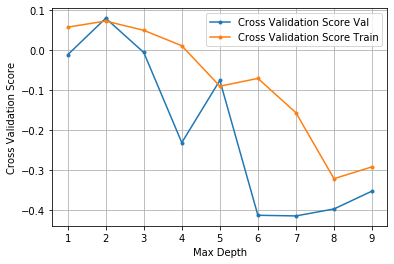

In [68]:
plt.figure()
plt.plot(depths, cross_validation_scores_val,label="Cross Validation Score Val",marker='.')
plt.plot(depths, cross_validation_scores_train,label="Cross Validation Score Train",marker='.')
plt.legend()
plt.xlabel('Max Depth')
plt.ylabel('Cross Validation Score')
plt.grid()
plt.show()

In [ ]:
tree = DecisionTreeRegressor(max_depth=2)
    tree.fit(X_train_added_features, y_train)

In [55]:
from sklearn.ensemble import RandomForestRegressor

my_random_forest = RandomForestRegressor(n_estimators=50, max_depth=7)
my_random_forest.fit(X_train_added_features, y_train)


/Users/emilykasa/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  after removing the cwd from sys.path.


RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=7, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=50, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)

In [56]:
print(my_random_forest.score(X_test_added_features, y_test, sample_weight=None))
print(my_random_forest.score(X_train_added_features, y_train, sample_weight=None))

0.16972710894954746
0.42347292516104773
